In [117]:
#import librariles

import json #import json data
import pandas as pd 
import numpy as np

#process sentences and tokens
import nltk
from nltk.text import Text
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist

#draw network graphs, wordclouds, dendrograms
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

In [115]:
#import data
with open('data.json') as json_file:
    data = json.load(json_file)

In [199]:
#define functions

#extract frequent words
def freq(tokens,num):    
    freqdist = FreqDist(tokens)
    global freq_top
    freq_top=freqdist.most_common(num)
    return freq_top

#extract frequent bigrams
def freq_bigram(tokens,num):
    bgs=nltk.bigrams(tokens)
    fdist_bi = nltk.FreqDist(bgs)
    global freq_bi_top
    freq_bi_top=fdist_bi.most_common(num)
    return freq_bi_top

#find overlapped words between years
def common(lst1, lst2):
    return set(lst1).intersection(lst2)

#get location of a specific value in a dataframe
  #reference: https://www.geeksforgeeks.org/find-location-of-an-element-in-pandas-dataframe-in-python/
def getIndexes(df, value):   
    position = []
    result = df.isin([value]) #Whether each element in the DataFrame is contained in value.
    serises = result.any()
    col_list= list(serises[serises == True].index)  
    for col in col_list:
        rows = list(result[col][result[col] == True].index) 
        for row in rows:
            position.append((row, col))
    return position[0]

def plot_dendrogram(df,title):
    labels=df.index.to_list()
    dists = squareform(df) 
    linkage_matrix = linkage(dists, "ward")  #Perform hierarchical/agglomerative clustering
    fig = plt.figure(figsize=(20, 10))
    dendrogram(linkage_matrix, labels=labels)
    plt.title("Dendrogram: "+title)
    plt.show()
    
    all_values=[]
    for i in year:
        all_values.extend(list(df[i]))
    all_values_none_zero=[x for x in all_values if x>0]

    print("The most similar years",getIndexes(df,min(all_values_none_zero)))
    print("The least similar years",getIndexes(df,max(all_values)))

C:\Users\sooje\AppData\Local\Temp/ipykernel_29572/4089202725.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,8))


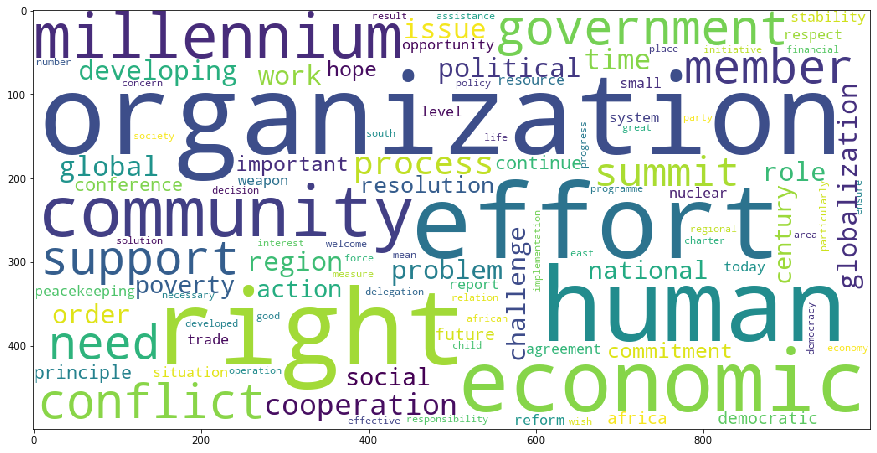

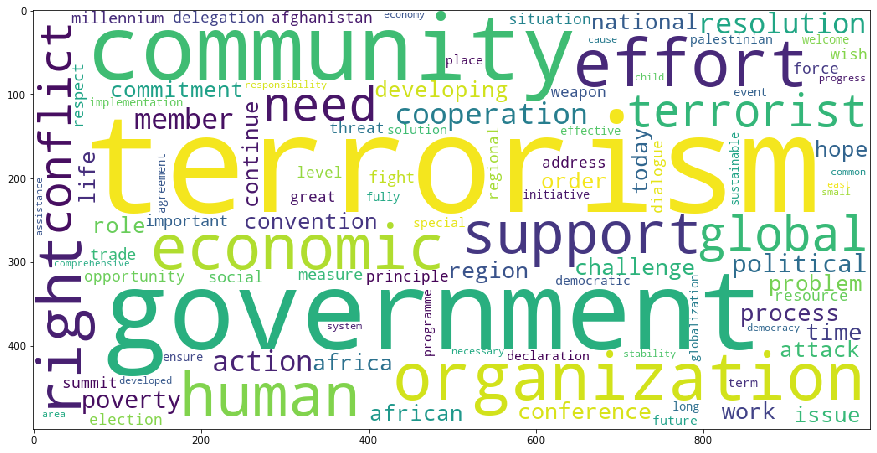

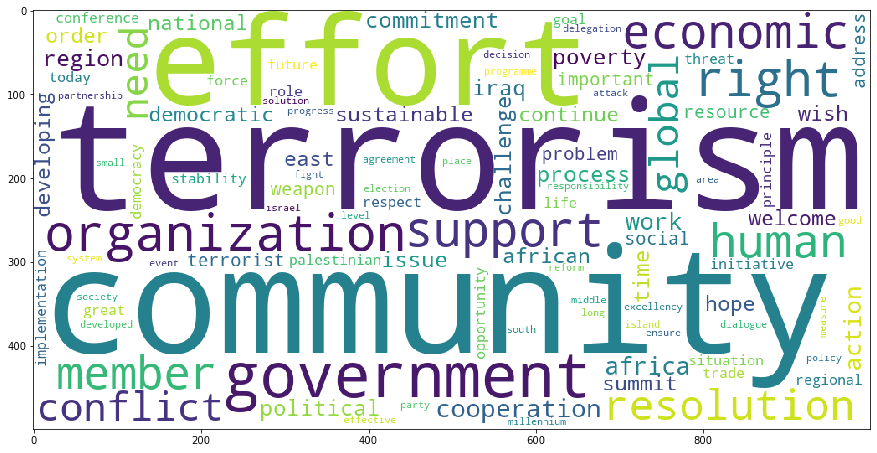

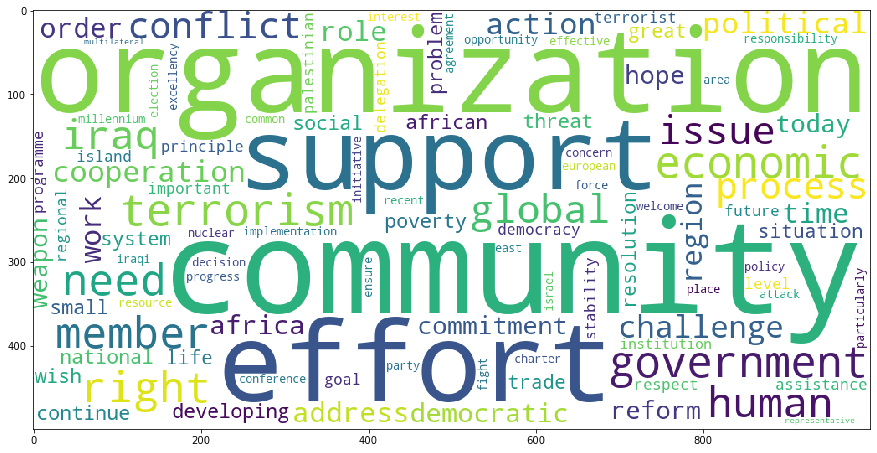

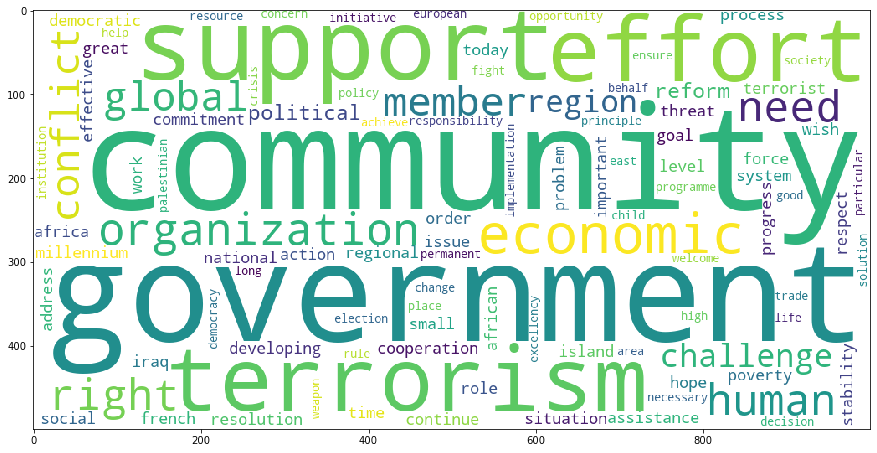

...

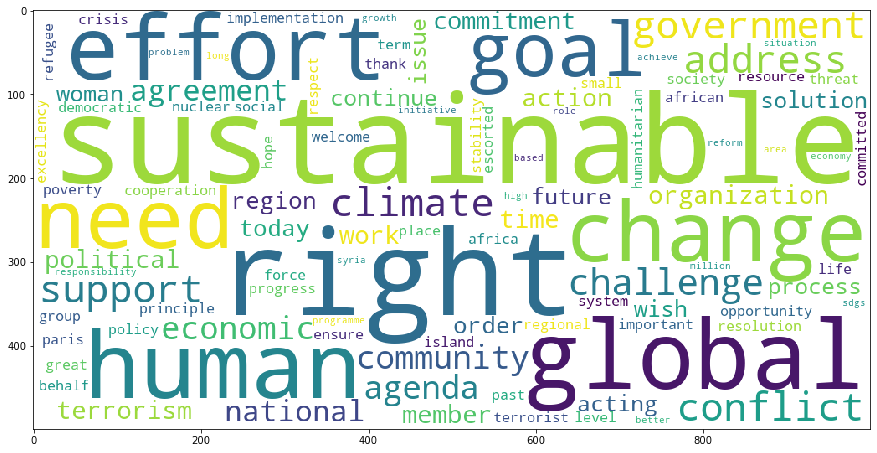

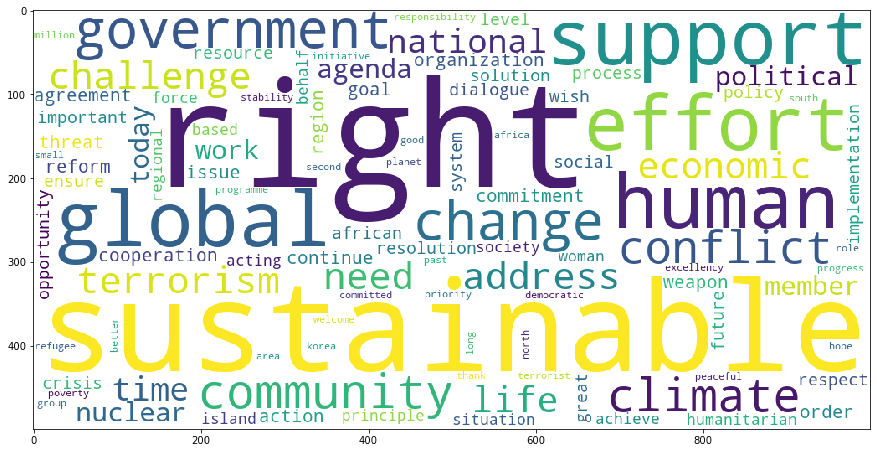

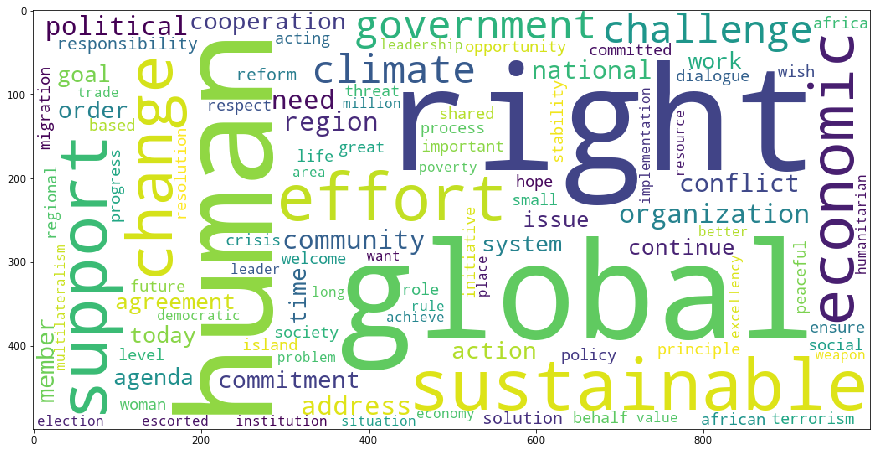

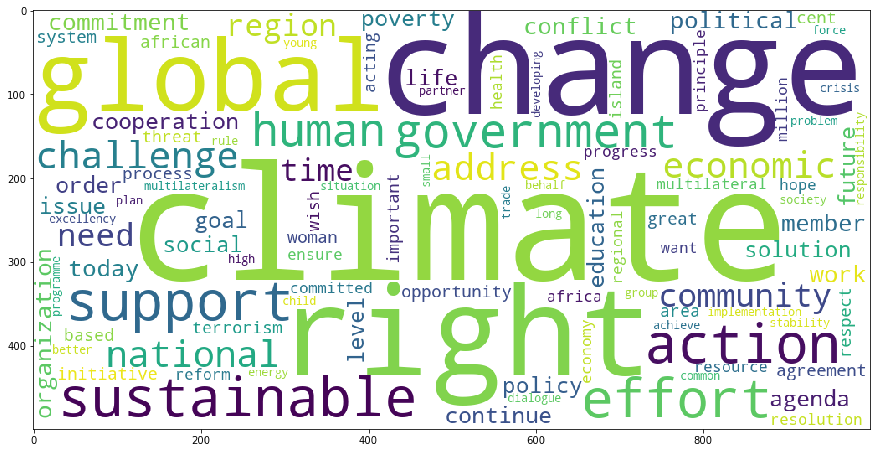

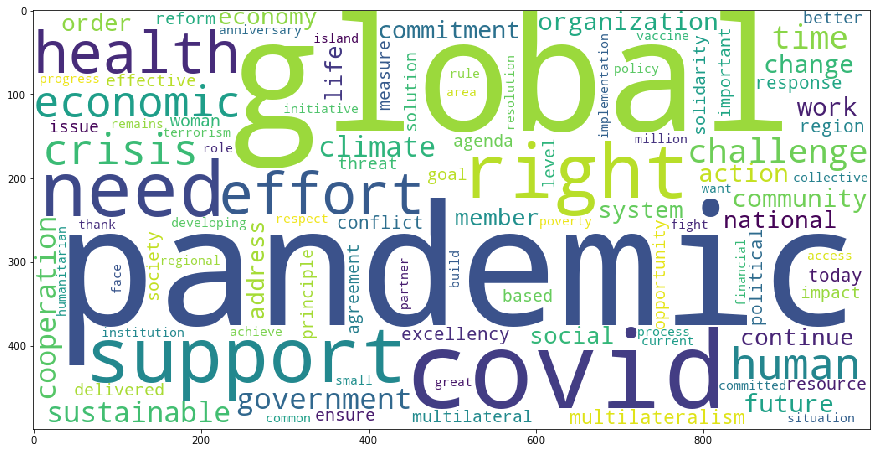

In [141]:
#1) compare frequent words by year

#1-1)extract frequent words and plot word clouds

#create dictionary to store frequent words by year
freq_dict={}

#extract frequent words
for i in data:
    freq(data[i],100)
    temp={}
    for j in freq_top:
        k=j[0]
        v=j[1]
        temp.update({k:v})
    
    #store frequent words in the dictionary(freq_dict)
    freq_dict.update({i:temp})
    
    #plot word clouds
    wordcloud = WordCloud(width = 1000, height = 500, background_color="white").generate_from_frequencies(temp)
    plt.figure(figsize=(15,8))
    plt.imshow(wordcloud) 

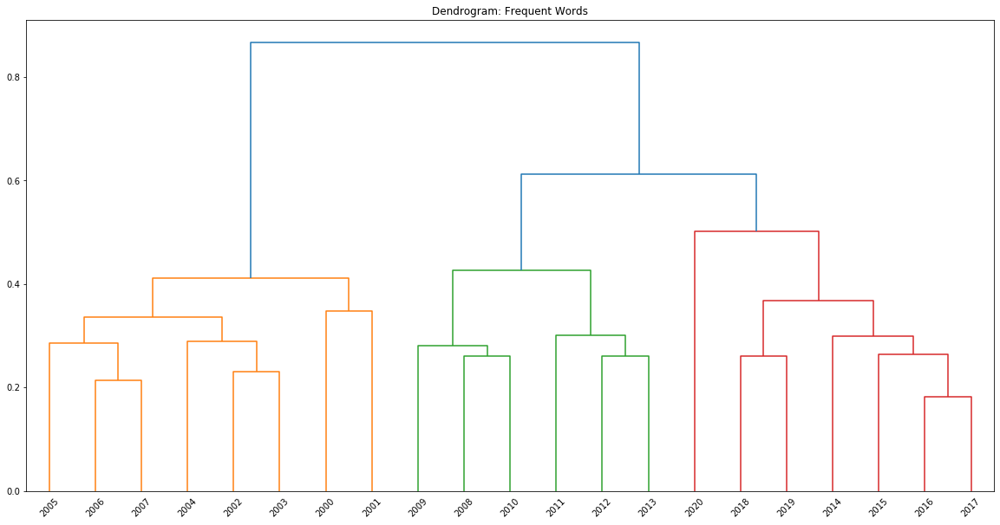

The most similar years ('2017', '2016')
The least similar years ('2020', '2000')


In [201]:
#1-2)calculate jaccard distance of each year's frequent words

#create dataframe to store jaccard distances
year=list(freq_dict.keys())
jac_dist_df=pd.DataFrame(index=year,columns=year).fillna(0.0)

#calculate jaccard distance between 2 years
for i in range(len(year)-1):
    for j in range(i+1,len(year)):
        
        #find frequent words 
        a_node=list(freq_dict[year[i]].keys())
        b_node=list(freq_dict[year[j]].keys())
        
        #find common words
        common_nodes=common(a_node,b_node)
        
        #calculate jaccard distance
        jac_dist=1-(len(common_nodes)/(len(a_node)+len(b_node)-len(common_nodes)))
        
        #store the value in the dataframe
        jac_dist_df.at[year[i],year[j]]=jac_dist
        jac_dist_df.at[year[j],year[i]]=jac_dist


#1-3) draw dendrogram and find minimum/maximum in jaccard dataframe = the most/least similar graphs
plot_dendrogram(jac_dist_df,"Frequent Words")

C:\Users\sooje\AppData\Local\Temp/ipykernel_29572/3296458036.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,8))


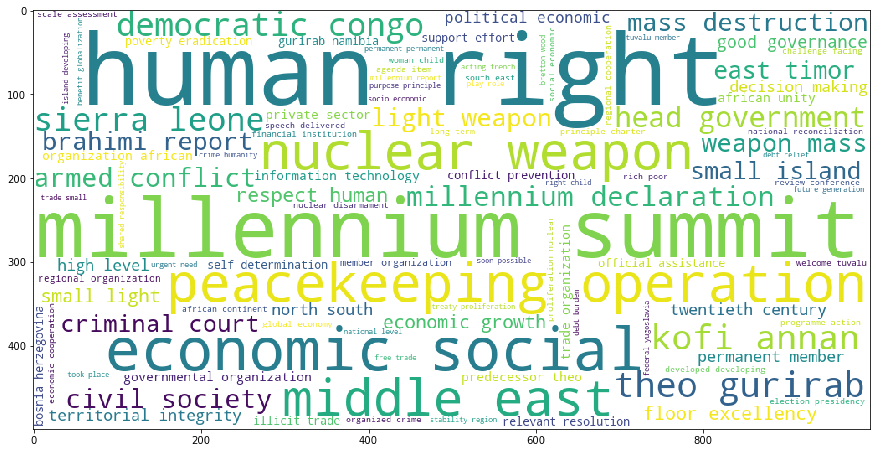

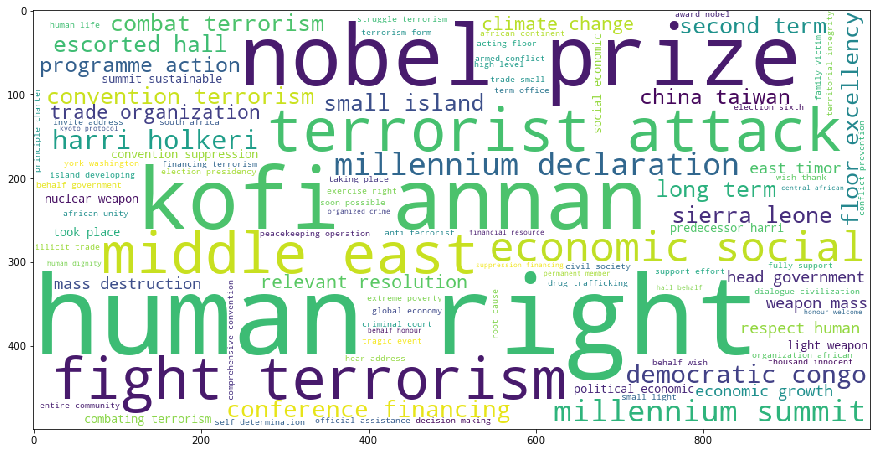

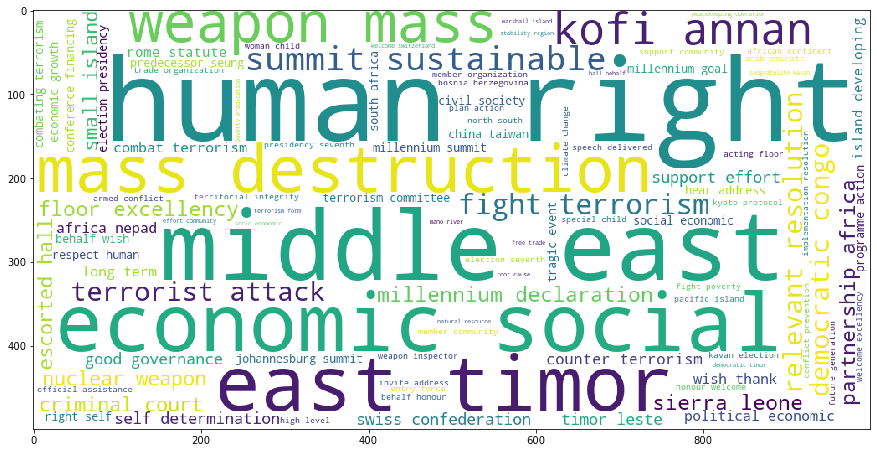

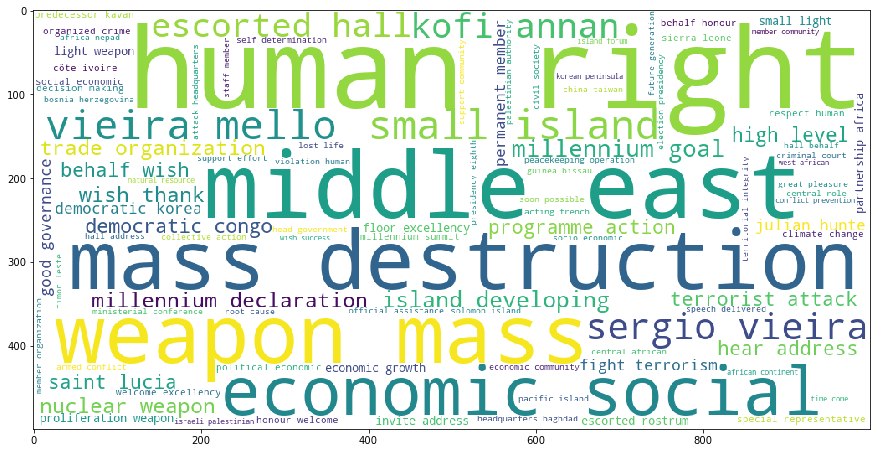

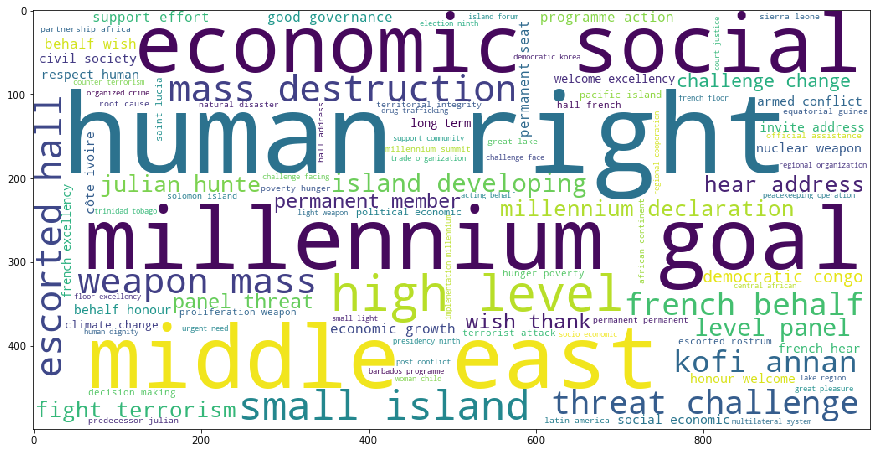

...

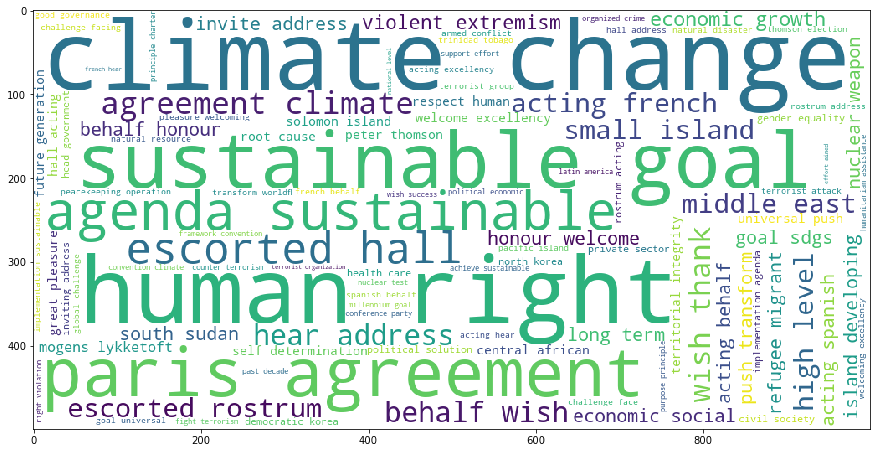

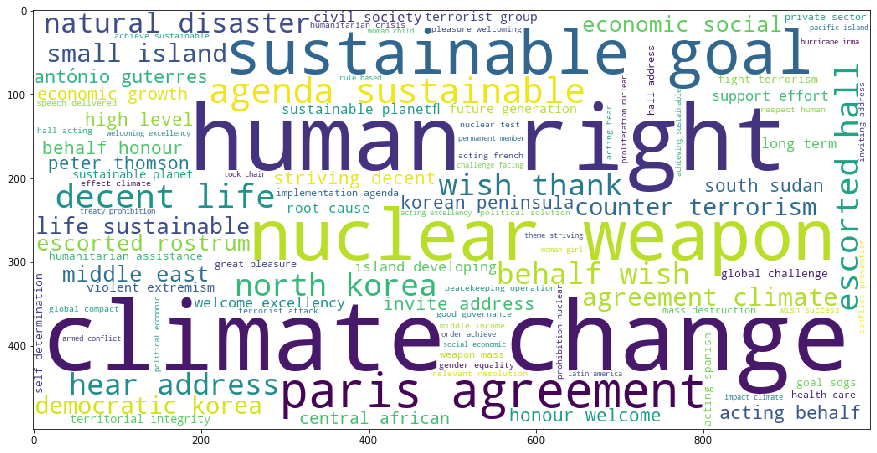

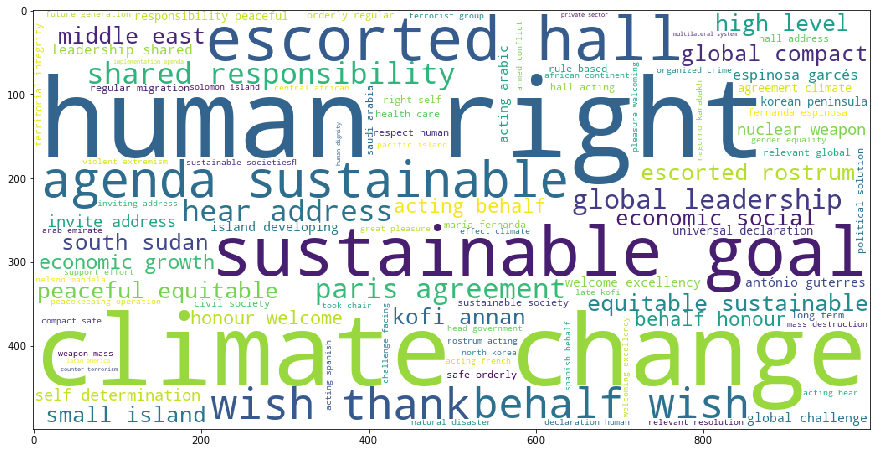

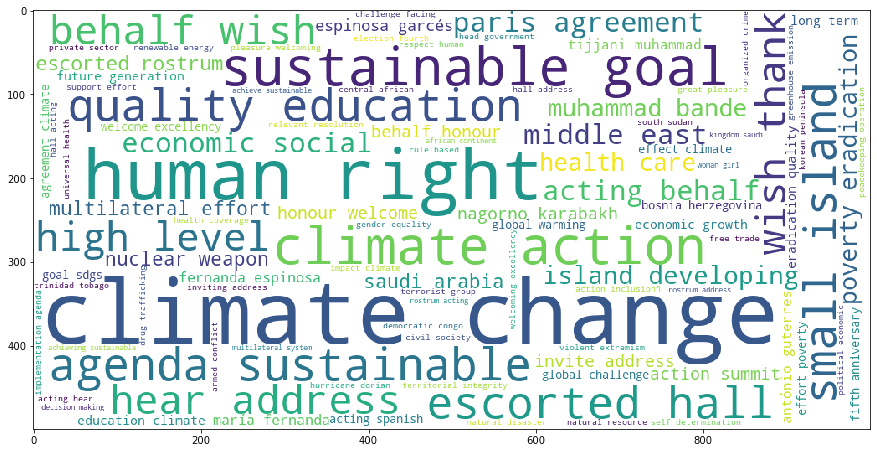

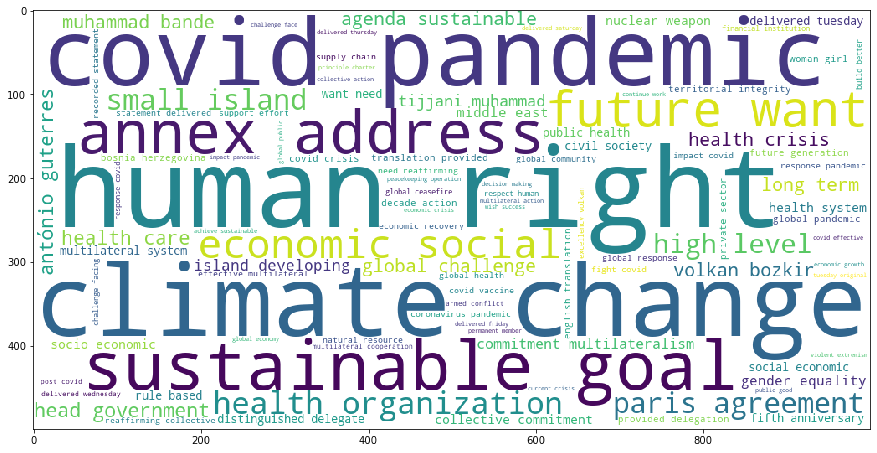

In [151]:
#2) compare frequent bigrams by year

#2-1)extract frequent words and plot word clouds

#create dictionary to store frequent words by year
freq_bi_dict={}

#extract frequent words
for i in data:
    freq_bigram(data[i],100)
    temp={}
    for j in freq_bi_top:
        k=j[0][0]+" "+j[0][1]
        v=j[1]
        temp.update({k:v})
        
    #store frequent words in the dictionary(freq_bi_dict)
    freq_bi_dict.update({i:temp})
    
    #plot word clouds
    wordcloud = WordCloud(width = 1000, height = 500, background_color="white").generate_from_frequencies(temp)
    plt.figure(figsize=(15,8))
    plt.imshow(wordcloud) 

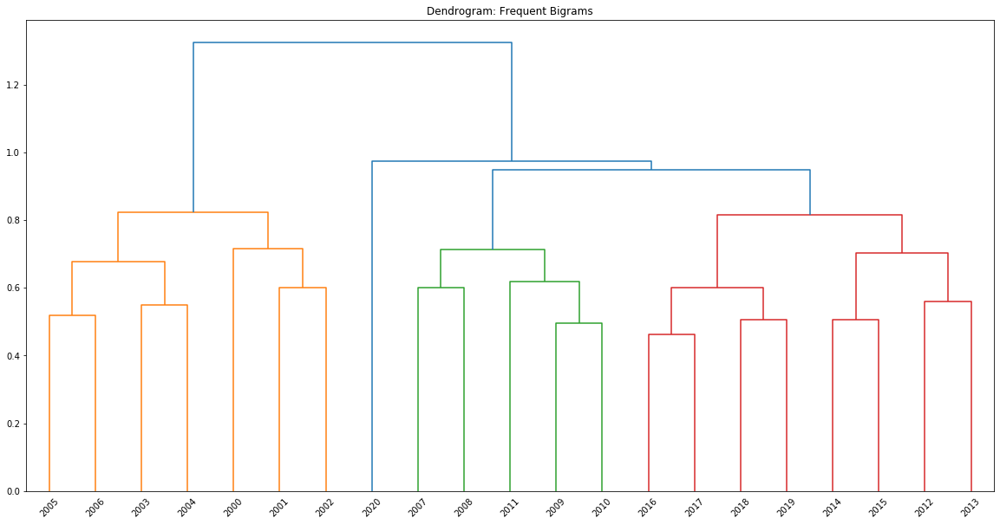

The most similar years ('2017', '2016')
The least similar years ('2020', '2005')


In [202]:
#2-2)calculate jaccard distance of each year's frequent words

#create dataframe to store jaccard distances
year=list(freq_bi_dict.keys())
jac_dist_bi_df=pd.DataFrame(index=year,columns=year).fillna(0.0)

#calculate jaccard distance between 2 years
for i in range(len(year)-1):
    for j in range(i+1,len(year)):
        
        #find frequent bigrams 
        a_node=list(freq_bi_dict[year[i]].keys())
        b_node=list(freq_bi_dict[year[j]].keys())
        
        #find common bigrams
        common_nodes=common(a_node,b_node)
        
        #calculate jaccard distance
        jac_dist=1-(len(common_nodes)/(len(a_node)+len(b_node)-len(common_nodes)))
        
        #store the value in the dataframe
        jac_dist_bi_df.at[year[i],year[j]]=jac_dist
        jac_dist_bi_df.at[year[j],year[i]]=jac_dist


#12-3) draw dendrogram and find minimum/maximum in jaccard dataframe = the most/least similar graphs
plot_dendrogram(jac_dist_bi_df,"Frequent Bigrams")